In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize']=(10,5)
plt.rcParams['figure.dpi']=300
sns.set_style('darkgrid')
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

#feature selection libraries
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeRegressor ,plot_tree
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from yellowbrick.model_selection import rfecv
from sklearn.svm import SVR


#check multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

#pps
import ppscore as ps

In [3]:
df = pd.read_csv(r'C:\Users\Rajesh Gonnade\Downloads\energy_production .csv')
df
raw_data = pd.read_csv(r'C:\Users\Rajesh Gonnade\Downloads\energy_production .csv')
raw_data

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,9.59,38.56,1017.01,60.10,481.30
1,12.04,42.34,1019.72,94.67,465.36
2,13.87,45.08,1024.42,81.69,465.48
3,13.72,54.30,1017.89,79.08,467.05
4,15.14,49.64,1023.78,75.00,463.58
...,...,...,...,...,...
9563,17.10,49.69,1005.53,81.82,457.32
9564,24.73,65.34,1015.42,52.80,446.92
9565,30.44,56.24,1005.19,56.24,429.34
9566,23.00,66.05,1020.61,80.29,421.57


In [4]:
df.describe()

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
count,9568.000000,9568.000000,9568.000000,9568.000000,9568.000000
mean,19.651231,54.305804,1013.259078,73.308978,454.365009
std,7.452473,12.707893,5.938784,14.600269,17.066995
min,1.810000,25.360000,992.890000,25.560000,420.260000
25%,13.510000,41.740000,1009.100000,63.327500,439.750000
50%,20.345000,52.080000,1012.940000,74.975000,451.550000
75%,25.720000,66.540000,1017.260000,84.830000,468.430000
max,37.110000,81.560000,1033.300000,100.160000,495.760000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9568 entries, 0 to 9567
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   temperature        9568 non-null   float64
 1   exhaust_vacuum     9568 non-null   float64
 2   amb_pressure       9568 non-null   float64
 3   r_humidity         9568 non-null   float64
 4   energy_production  9568 non-null   float64
dtypes: float64(5)
memory usage: 373.9 KB


<AxesSubplot:>

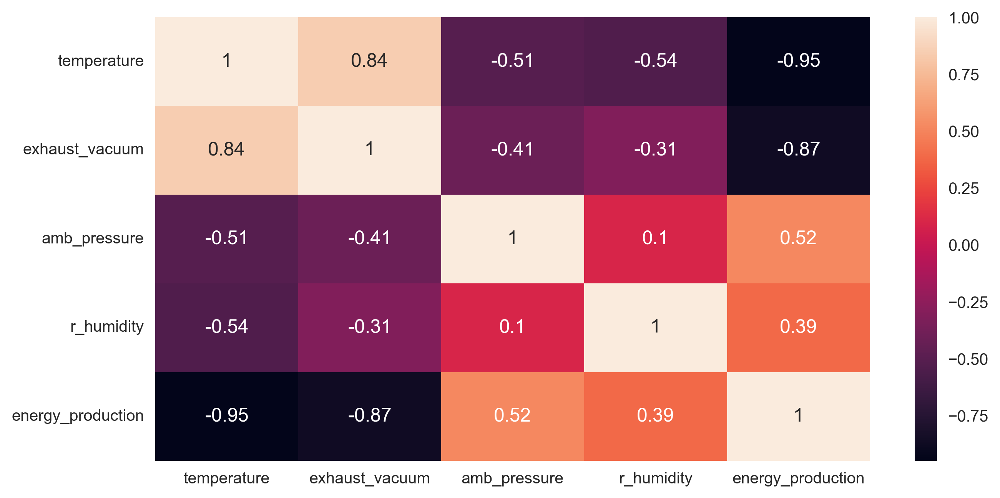

In [6]:
# correlation coefficeient
sns.heatmap(raw_data.corr(),annot=True)

# Ducplicated

In [7]:
df.duplicated().sum()

41

# print duplicated

In [8]:
df[df.duplicated()]

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
2066,10.72,41.17,1019.68,60.71,479.21
2780,28.41,75.60,1018.48,56.07,440.28
3333,24.79,75.60,1017.07,68.23,440.05
3467,7.64,41.17,1020.01,75.14,488.53
3550,25.42,75.60,1017.39,77.63,438.24
3747,11.61,41.17,1019.57,58.82,476.81
4292,12.27,41.17,1019.41,58.10,475.13
4528,24.63,59.57,1010.45,85.36,440.67
5065,8.57,41.17,1020.18,72.47,484.20
5564,11.82,41.17,1019.50,55.74,475.61


In [9]:
df[(df['temperature']==10.72) & (df['exhaust_vacuum']==41.17)]

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
1933,10.72,41.17,1019.68,60.71,479.21
2066,10.72,41.17,1019.68,60.71,479.21


# drop Duplicated records

In [10]:
df.drop_duplicates(inplace=True)

In [11]:
df

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,9.59,38.56,1017.01,60.10,481.30
1,12.04,42.34,1019.72,94.67,465.36
2,13.87,45.08,1024.42,81.69,465.48
3,13.72,54.30,1017.89,79.08,467.05
4,15.14,49.64,1023.78,75.00,463.58
...,...,...,...,...,...
9563,17.10,49.69,1005.53,81.82,457.32
9564,24.73,65.34,1015.42,52.80,446.92
9565,30.44,56.24,1005.19,56.24,429.34
9566,23.00,66.05,1020.61,80.29,421.57


In [12]:
df.reset_index(drop=True, inplace=True)
df

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,9.59,38.56,1017.01,60.10,481.30
1,12.04,42.34,1019.72,94.67,465.36
2,13.87,45.08,1024.42,81.69,465.48
3,13.72,54.30,1017.89,79.08,467.05
4,15.14,49.64,1023.78,75.00,463.58
...,...,...,...,...,...
9522,17.10,49.69,1005.53,81.82,457.32
9523,24.73,65.34,1015.42,52.80,446.92
9524,30.44,56.24,1005.19,56.24,429.34
9525,23.00,66.05,1020.61,80.29,421.57


# visualizing missing values

<AxesSubplot:>

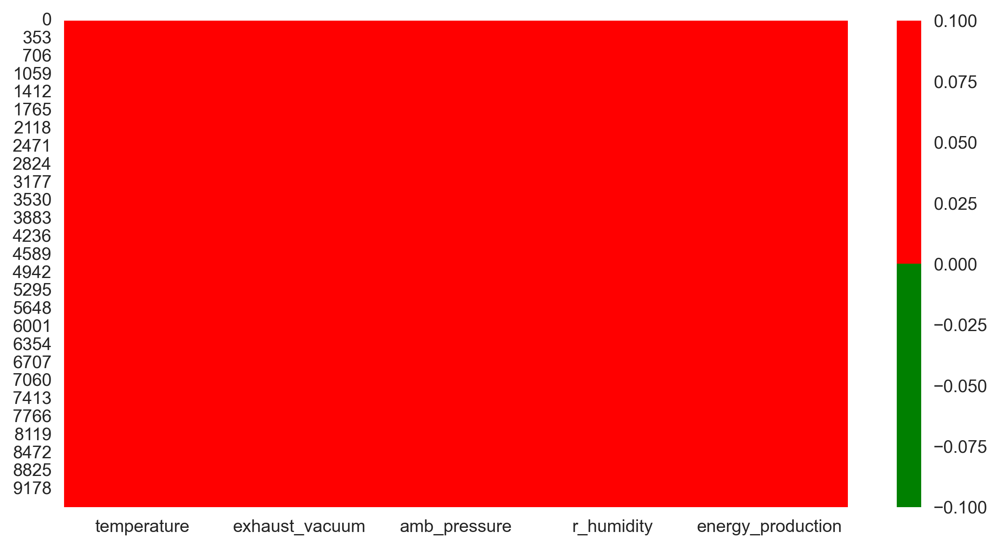

In [13]:
sns.heatmap(df.isna(),cmap=['green','red'])

#observation:no missing values

# outlier detection

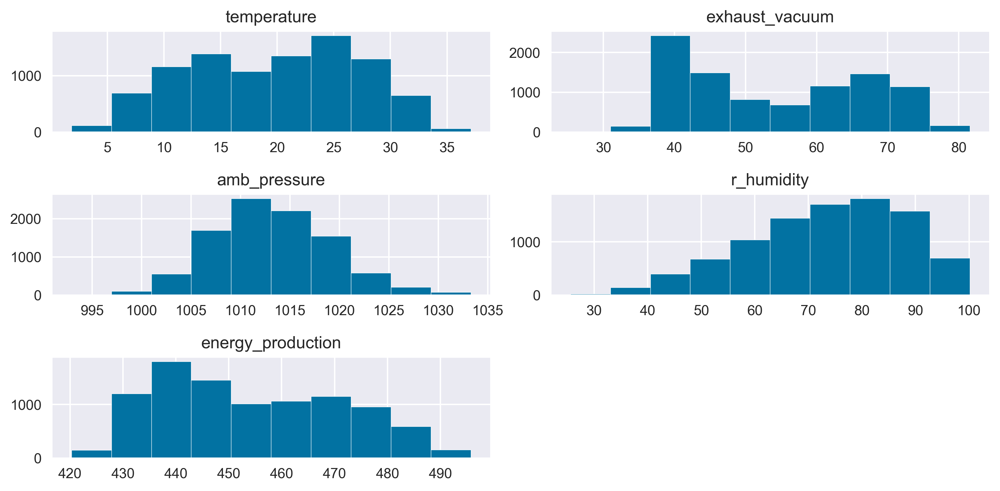

In [14]:
df.hist()
plt.tight_layout()

<AxesSubplot:>

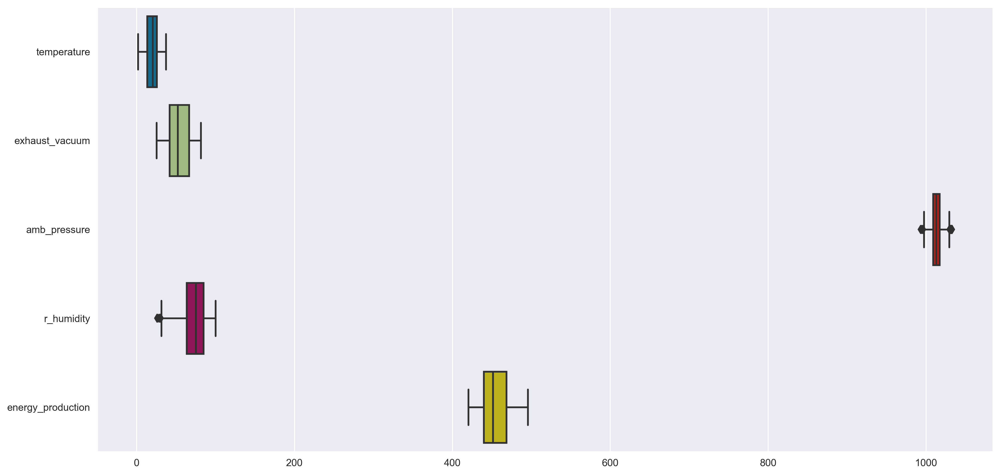

In [15]:
plt.figure(figsize=(16,8))
sns.boxplot(data=df,orient="h")

#observation:we can see few outliers

<AxesSubplot:xlabel='amb_pressure', ylabel='Density'>

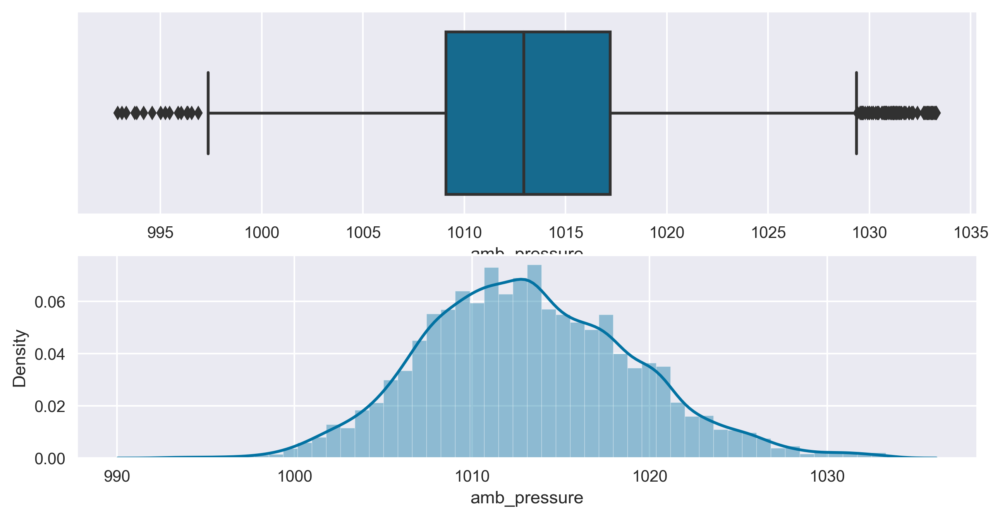

In [16]:
plt.subplot(2,1,1)
sns.boxplot(x=df['amb_pressure'],orient='h')
plt.subplot(2,1,2)
sns.distplot(df['amb_pressure'])

<AxesSubplot:xlabel='r_humidity', ylabel='Density'>

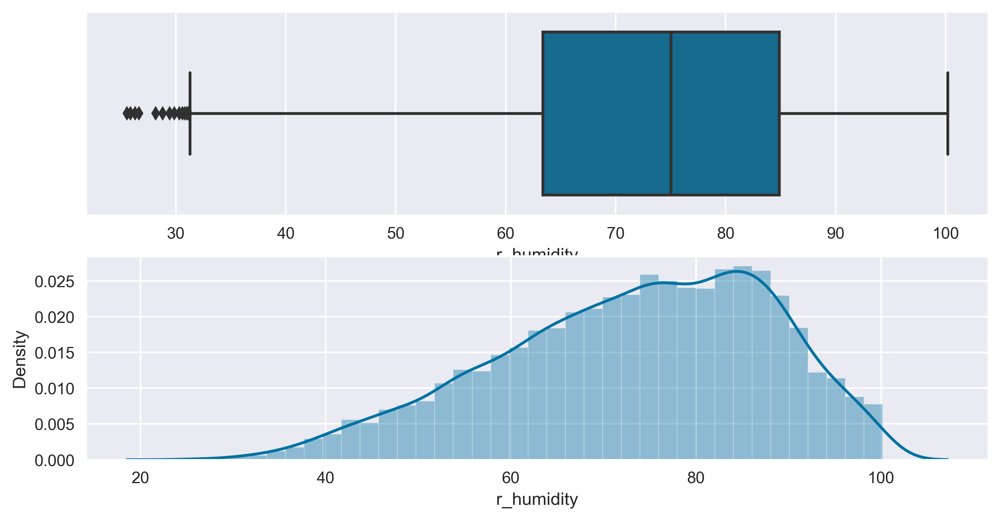

In [17]:
plt.subplot(2,1,1)
sns.boxplot(x=df['r_humidity'],orient='h')
plt.subplot(2,1,2)
sns.distplot(df['r_humidity'])

**observation: these two columns have outliers**

# outlier detection function(creating function)

In [18]:
def outler_detection(data,colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr= q3 - q1
    
    lower = q1-(1.5*iqr)
    upper = q3+(1.5*iqr)
    
    return print("lower:",lower,"upper:",upper)

In [19]:
outler_detection(df,'amb_pressure')

lower: 996.9125 upper: 1029.3725


In [20]:
outler_detection(df,'r_humidity')

lower: 31.16250000000001 upper: 117.06249999999999


In [21]:
#lets try capping the ouliers

In [22]:
df_cappped=df.copy()

In [23]:
df_cappped.loc[df_cappped['r_humidity']<31.16250000000001,'r_humidity'] #loc[row,col]

30      28.16
233     26.67
400     26.30
1154    25.89
1254    29.43
1814    30.59
5600    30.99
5664    29.86
6035    30.34
6201    28.81
7267    30.83
7908    25.56
8016    31.15
Name: r_humidity, dtype: float64

In [24]:
# capping outliers

In [25]:
df_cappped.loc[df_cappped['r_humidity']<31.16250000000001,'r_humidity']=31.16250000000001

<AxesSubplot:xlabel='r_humidity', ylabel='Density'>

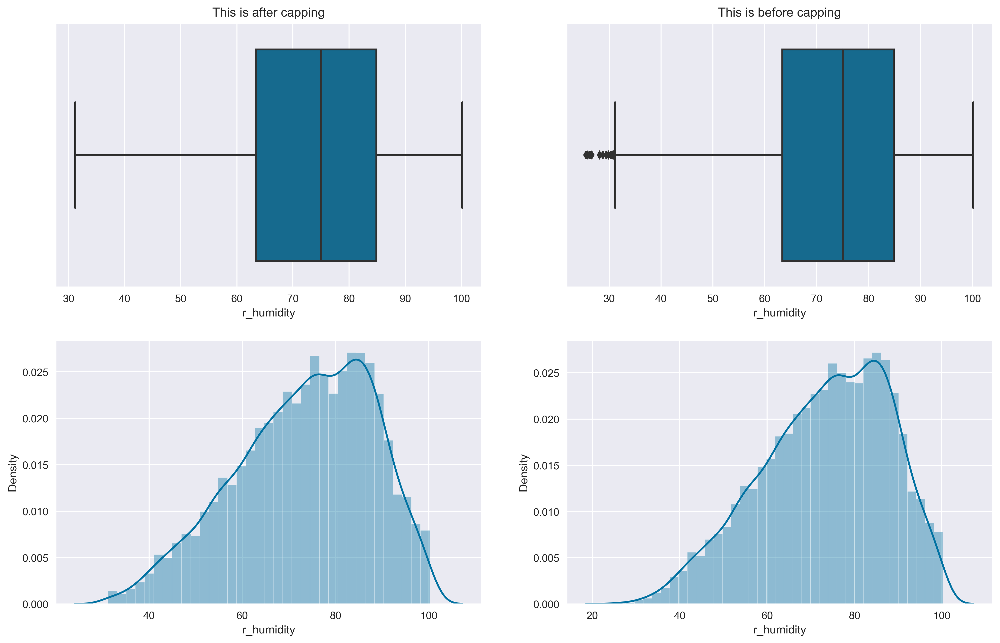

In [26]:
plt.figure(figsize=(16, 10))
plt.subplot(2,2,1)
sns.boxplot(x=df_cappped['r_humidity'],orient='h')
plt.title('This is after capping')
plt.subplot(2,2,2)
sns.boxplot(x=raw_data['r_humidity'],orient='h')
plt.title('This is before capping')
plt.subplot(2,2,3)
sns.distplot(df_cappped['r_humidity'])
plt.subplot(2,2,4)
sns.distplot(raw_data['r_humidity'])

In [27]:
df_cappped.loc[df_cappped['amb_pressure']<996.9125,'amb_pressure']

962     996.35
2790    995.02
3392    993.82
3877    996.87
4194    996.55
4231    993.74
4777    993.31
5161    994.60
5283    995.24
5555    992.89
5879    996.32
6410    995.88
7570    994.17
7748    993.11
7992    995.45
8071    996.03
Name: amb_pressure, dtype: float64

In [28]:
df_cappped.loc[df_cappped['amb_pressure']<996.9125,'amb_pressure']=996.9125

In [29]:
df_cappped.loc[df['amb_pressure']>1029.3725,'amb_pressure']

38      1033.09
175     1029.90
315     1031.34
319     1030.42
385     1031.96
         ...   
9058    1030.38
9090    1031.96
9293    1029.65
9330    1031.14
9462    1030.10
Name: amb_pressure, Length: 75, dtype: float64

In [30]:
df_cappped.loc[df_cappped['amb_pressure']>1029.3725,'amb_pressure']=1029.3725

<AxesSubplot:ylabel='Density'>

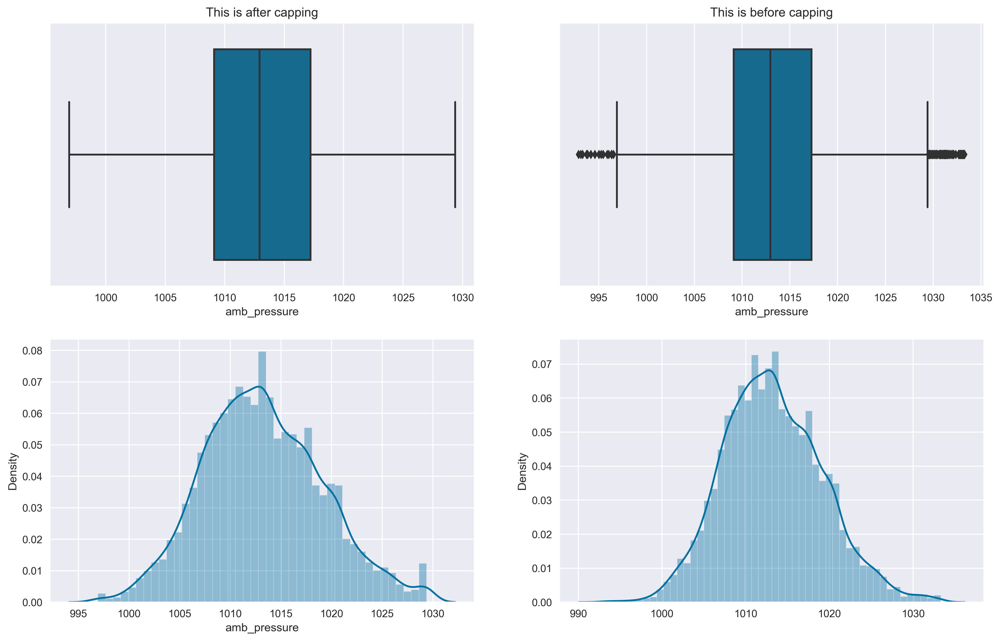

In [31]:
plt.figure(figsize=(16, 10))
plt.subplot(2,2,1)
sns.boxplot(x=df_cappped['amb_pressure'],orient='h')
plt.title('This is after capping')
plt.subplot(2,2,2)
sns.boxplot(x=raw_data['amb_pressure'],orient='h')
plt.title('This is before capping')
plt.subplot(2,2,3)
sns.distplot(df_cappped['amb_pressure'])
plt.subplot(2,2,4)
sns.distplot(x=raw_data['amb_pressure'])

<AxesSubplot:>

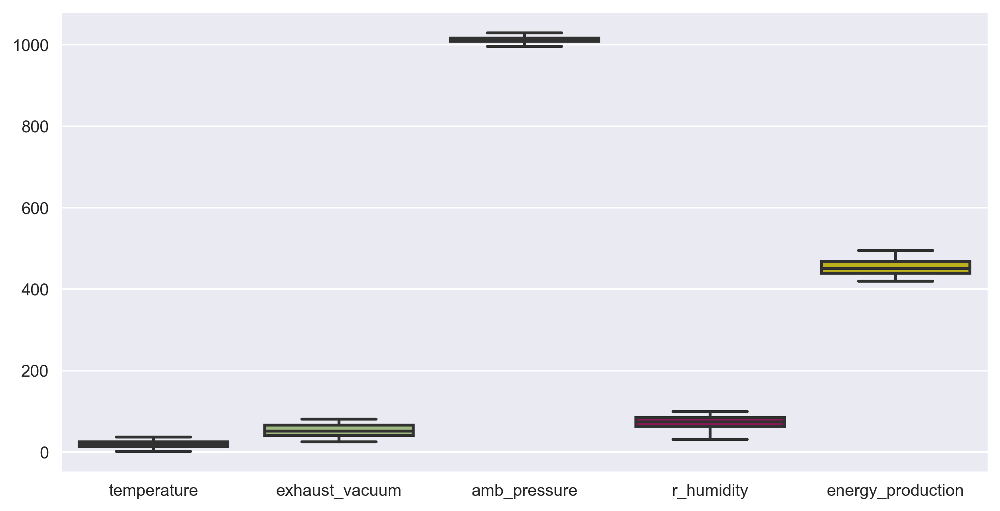

In [32]:
sns.boxplot(data=df_cappped,orient="v")

In [33]:
#all outliers are capped

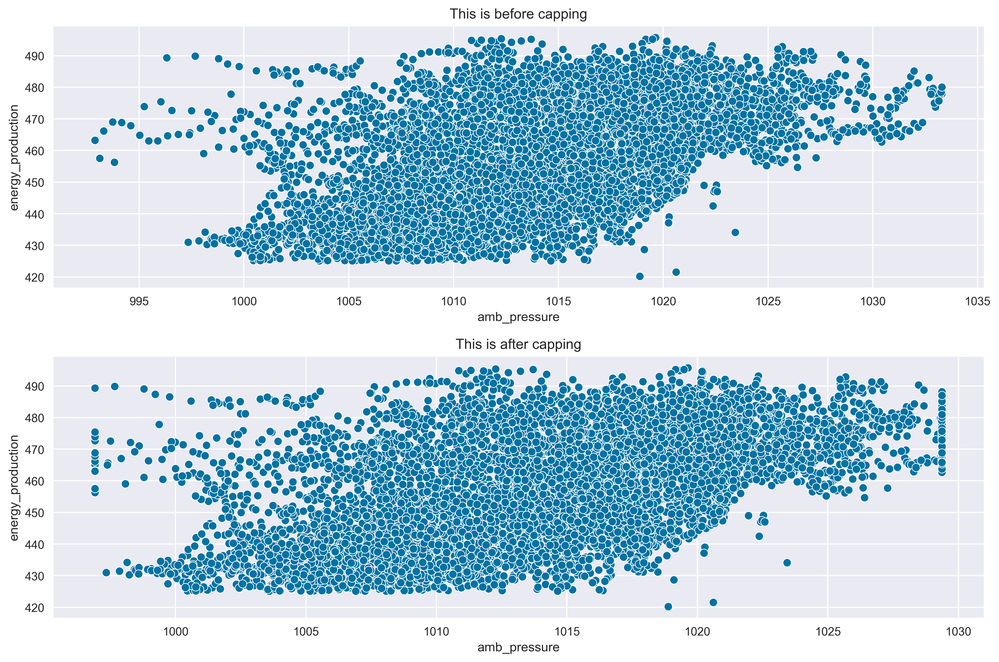

In [34]:
plt.figure(figsize=(12, 8))
plt.subplot(2,1,1)
sns.scatterplot(x=raw_data['amb_pressure'],y=raw_data['energy_production'])
plt.title('This is before capping')

plt.subplot(2,1,2)
sns.scatterplot(x=df_cappped['amb_pressure'],y=df_cappped['energy_production'])
plt.title('This is after capping')

plt.tight_layout()

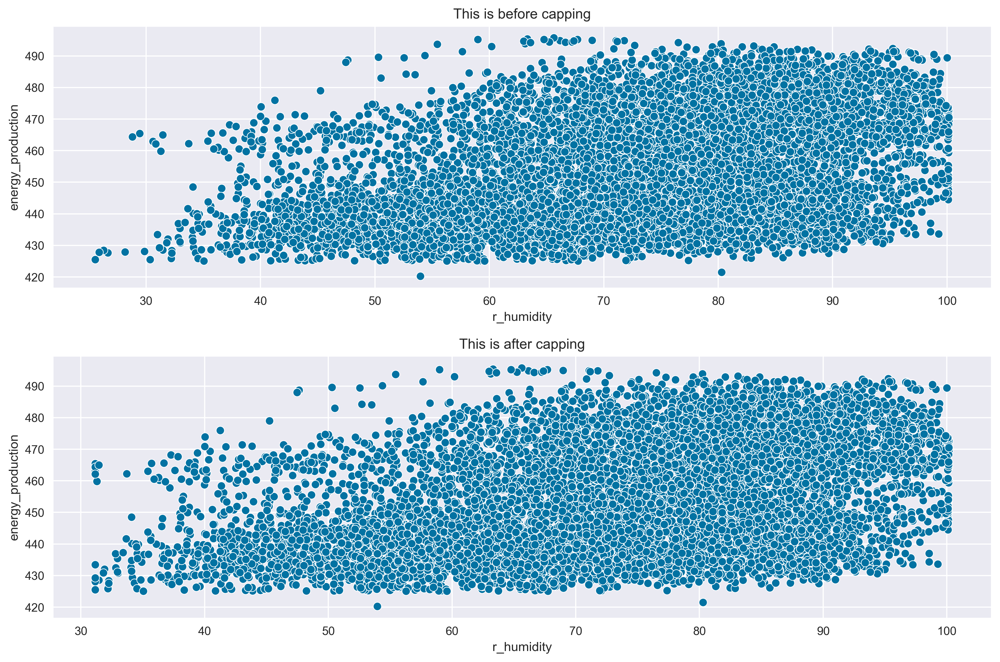

In [35]:
plt.figure(figsize=(12, 8))
plt.subplot(2,1,1)
sns.scatterplot(x=raw_data['r_humidity'],y=raw_data['energy_production'])
plt.title('This is before capping')

plt.subplot(2,1,2)
sns.scatterplot(x=df_cappped['r_humidity'],y=df_cappped['energy_production'])
plt.title('This is after capping')
plt.tight_layout()

In [36]:
#lets try median replacement

In [37]:
df_median_replaced=df.copy()

In [38]:
df_median_replaced.loc[df_median_replaced['amb_pressure']<996.9125,'amb_pressure']=df_median_replaced['amb_pressure'].median()

In [39]:
df_median_replaced.loc[df_median_replaced['amb_pressure']>1029.3725,'amb_pressure']=df_median_replaced['amb_pressure'].median()

<AxesSubplot:ylabel='Density'>

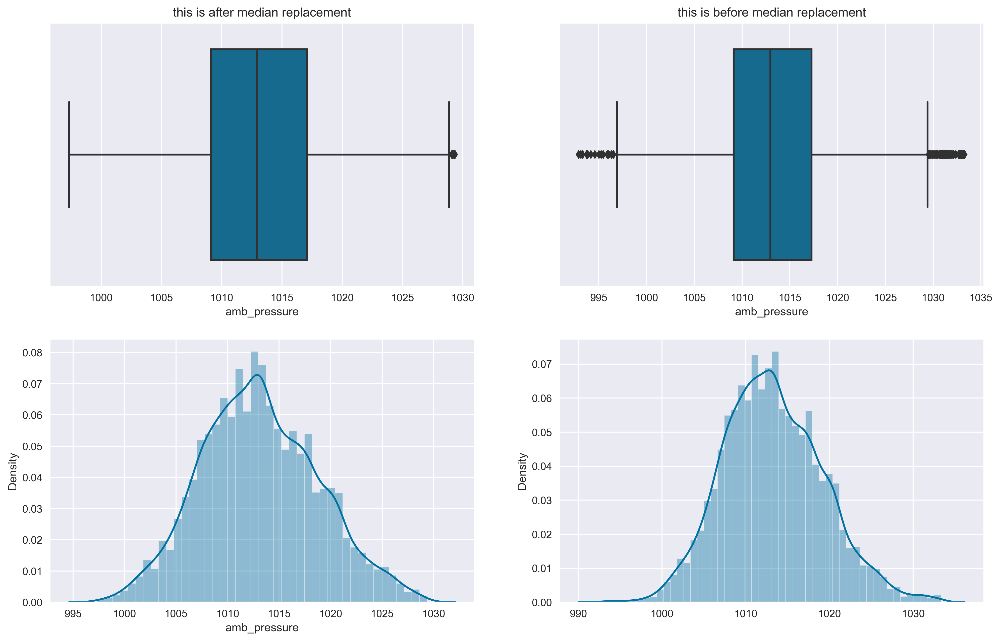

In [40]:
plt.figure(figsize=(16, 10))
plt.subplot(2,2,1)
sns.boxplot(x=df_median_replaced['amb_pressure'],orient='h')
plt.title('this is after median replacement')
plt.subplot(2,2,2)
sns.boxplot(x=raw_data['amb_pressure'],orient='h')
plt.title('this is before median replacement')
plt.subplot(2,2,3)
sns.distplot(df_median_replaced['amb_pressure'])
plt.subplot(2,2,4)
sns.distplot(x=raw_data['amb_pressure'])

In [41]:
df_median_replaced.loc[df_median_replaced['r_humidity']<31.16250000000001,'r_humidity']=df_median_replaced['r_humidity'].median()

<AxesSubplot:ylabel='Density'>

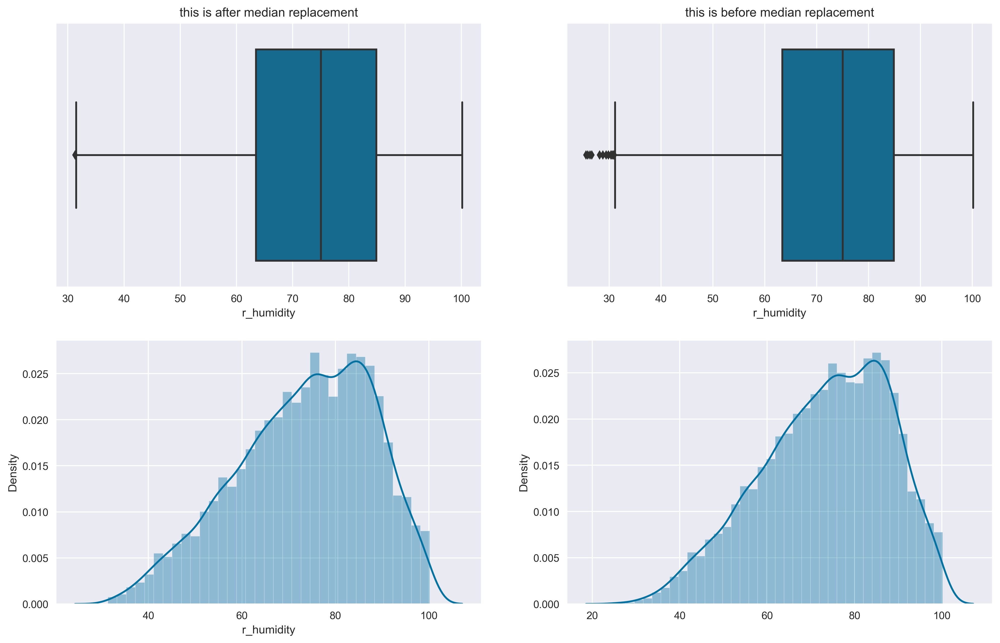

In [42]:
plt.figure(figsize=(16, 10))
plt.subplot(2,2,1)
sns.boxplot(x=df_median_replaced['r_humidity'],orient='h')
plt.title('this is after median replacement')
plt.subplot(2,2,2)
sns.boxplot(x=raw_data['r_humidity'],orient='h')
plt.title('this is before median replacement')
plt.subplot(2,2,3)
sns.distplot(df_median_replaced['r_humidity'])
plt.subplot(2,2,4)
sns.distplot(x=raw_data['r_humidity'])

<AxesSubplot:>

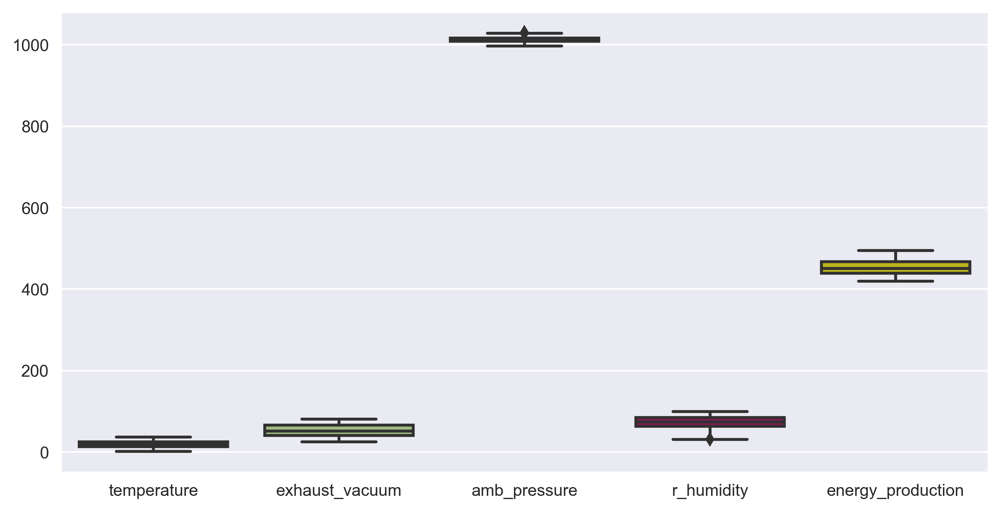

In [43]:
sns.boxplot(data=df_median_replaced,orient="v")

In [44]:
#observation: median replacement doesnot remove all the outliers

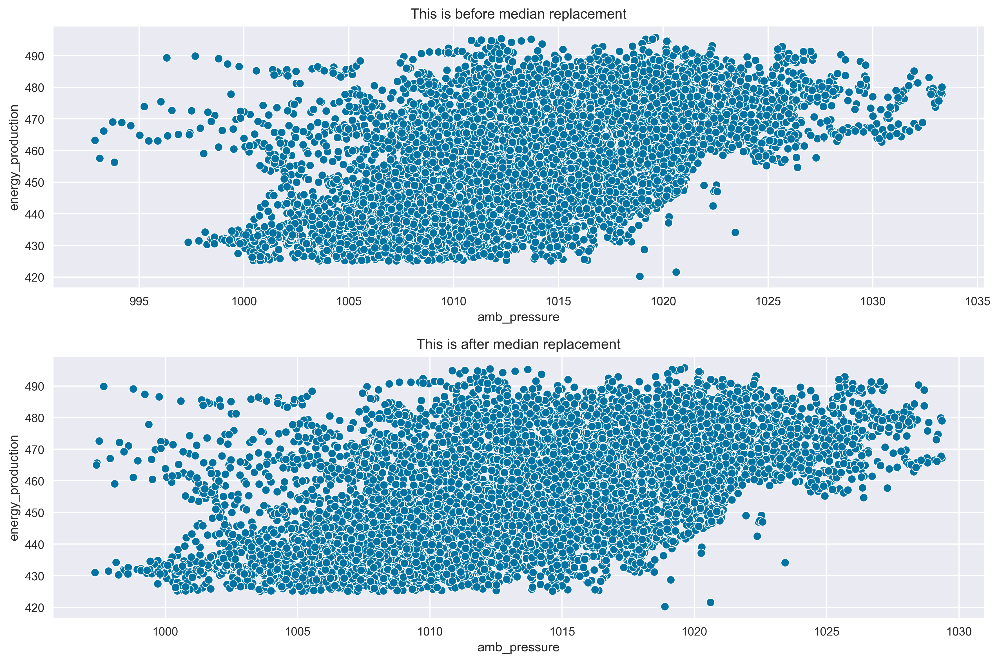

In [45]:
plt.figure(figsize=(12, 8))
plt.subplot(2,1,1)
sns.scatterplot(x=raw_data['amb_pressure'],y=raw_data['energy_production'])
plt.title('This is before median replacement')

plt.subplot(2,1,2)
sns.scatterplot(x=df_median_replaced['amb_pressure'],y=df_median_replaced['energy_production'])
plt.title('This is after median replacement')

plt.tight_layout()

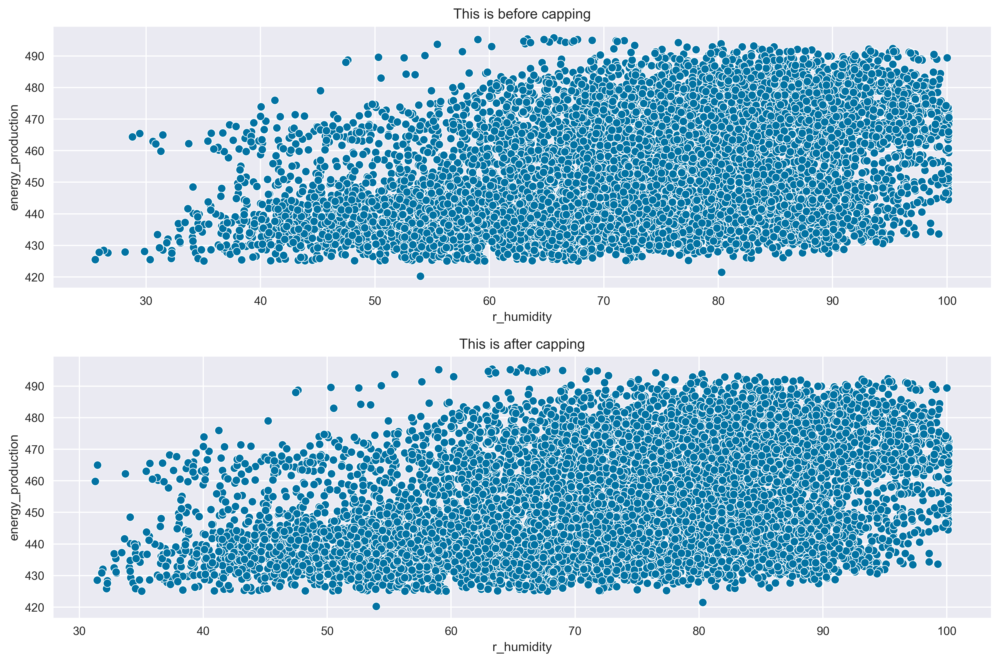

In [46]:
plt.figure(figsize=(12, 8))
plt.subplot(2,1,1)
sns.scatterplot(x=raw_data['r_humidity'],y=raw_data['energy_production'])
plt.title('This is before capping')

plt.subplot(2,1,2)
sns.scatterplot(x=df_median_replaced['r_humidity'],y=df_median_replaced['energy_production'])
plt.title('This is after capping')
plt.tight_layout()

# scaling the data
- Standrdization(StandardScaler)
  - Uses z scores for scaling
  - scale values in such a way that the mean=0 and sd=1  

In [47]:
y=df_cappped['energy_production']
x=df_cappped.iloc[:,:-1]

In [48]:
x

,temperature,exhaust_vacuum,amb_pressure,r_humidity
0,9.59,38.56,1017.01,60.10
1,12.04,42.34,1019.72,94.67
2,13.87,45.08,1024.42,81.69
3,13.72,54.30,1017.89,79.08
4,15.14,49.64,1023.78,75.00
...,...,...,...,...
9522,17.10,49.69,1005.53,81.82
9523,24.73,65.34,1015.42,52.80
9524,30.44,56.24,1005.19,56.24
9525,23.00,66.05,1020.61,80.29


In [49]:
y

0       481.30
1       465.36
2       465.48
3       467.05
4       463.58
         ...  
9522    457.32
9523    446.92
9524    429.34
9525    421.57
9526    454.41
Name: energy_production, Length: 9527, dtype: float64

In [50]:
sc=StandardScaler()

In [51]:
sc.fit_transform(x)

array([[-1.35252773, -1.24025409,  0.64292836, -0.90690647],
       [-1.02340389, -0.94227944,  1.10331069,  1.46138082],
       [-0.77756852, -0.72628724,  1.90175976,  0.57215985],
       ...,
       [ 1.44838336,  0.15344742, -1.36508611, -1.17134352],
       [ 0.44892156,  0.92676256,  1.25450637,  0.47625003],
       [-0.25634382, -0.39756918,  1.29697706, -0.66233645]])

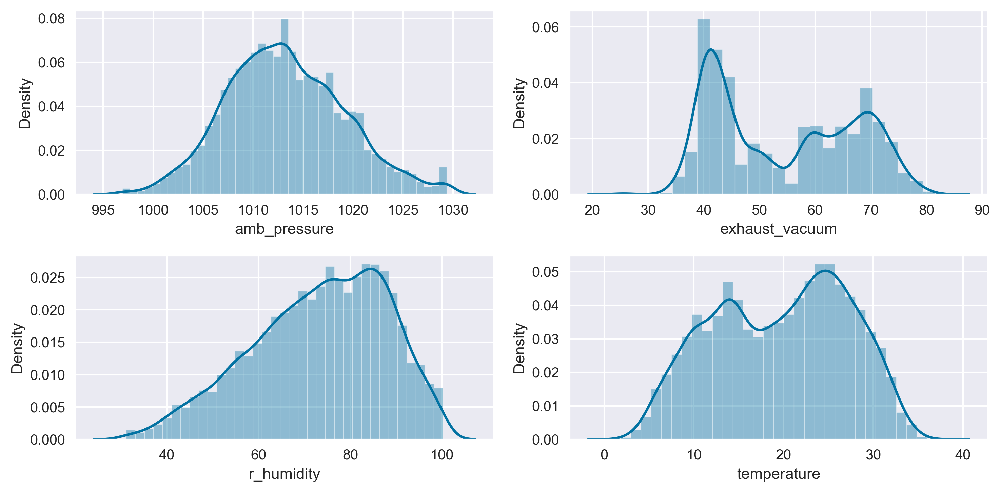

In [52]:
#dist plot for all the faeture columns

plt.subplot(2, 2, 1)
sns.distplot(x['amb_pressure'])

plt.subplot(2, 2, 2)
sns.distplot(x['exhaust_vacuum'])

plt.subplot(2, 2, 3)
sns.distplot(x['r_humidity'])

plt.subplot(2, 2, 4)
sns.distplot(x['temperature'])

plt.tight_layout()

<AxesSubplot:xlabel='energy_production', ylabel='Density'>

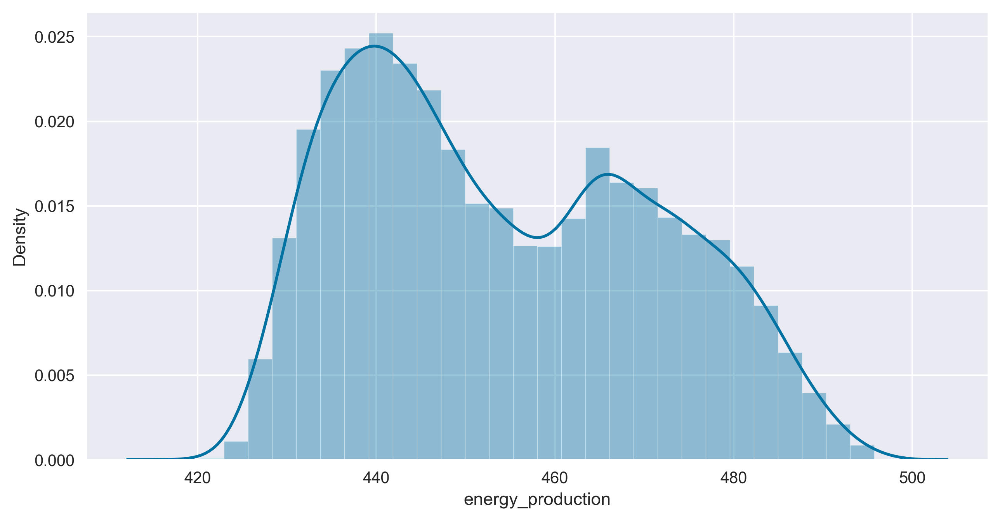

In [53]:
#distplot for dependent column

sns.distplot(y)

# Multicollinearity

In [54]:
x

,temperature,exhaust_vacuum,amb_pressure,r_humidity
0,9.59,38.56,1017.01,60.10
1,12.04,42.34,1019.72,94.67
2,13.87,45.08,1024.42,81.69
3,13.72,54.30,1017.89,79.08
4,15.14,49.64,1023.78,75.00
...,...,...,...,...
9522,17.10,49.69,1005.53,81.82
9523,24.73,65.34,1015.42,52.80
9524,30.44,56.24,1005.19,56.24
9525,23.00,66.05,1020.61,80.29


In [55]:
x.values

array([[   9.59,   38.56, 1017.01,   60.1 ],
       [  12.04,   42.34, 1019.72,   94.67],
       [  13.87,   45.08, 1024.42,   81.69],
       ...,
       [  30.44,   56.24, 1005.19,   56.24],
       [  23.  ,   66.05, 1020.61,   80.29],
       [  17.75,   49.25, 1020.86,   63.67]])

In [56]:
vif = pd.DataFrame()
vif

""


In [57]:
vif['Features'] = x.columns
vif

,Features
0,temperature
1,exhaust_vacuum
2,amb_pressure
3,r_humidity


In [58]:
vif['VIF'] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]

In [59]:
vif

,Features,VIF
0,temperature,39.308434
1,exhaust_vacuum,75.103832
2,amb_pressure,66.875647
3,r_humidity,40.915610


# Here’s how you can interpret the VIF values:

- A VIF of 1 indicates that there’s no correlation between a given predictor (independent variable) and any other predictors. This predictor is perfectly okay, and there’s no multicollinearity.
- A VIF between 1 and 5 is generally considered acceptable. It suggests moderate correlation, but it is not severe enough to warrant corrective measures.
- A VIF above 5 (or sometimes above 10, depending on the context and the field of study) indicates high multicollinearity. This can be problematic, and you might want to consider dropping the variable from your model or using techniques to address multicollinearity.

# In my case, all of your variables have a VIF greater than 5, which suggests that there might be high multicollinearity in my data. This means that these variables might not add much value to my model independently because they can be linearly predicted from the others.

Note:while high multicollinearity can pose problems in understanding the individual effects of predictors, it does not affect the model’s ability to predict the dependent variable.

#there is high multicollinearity between exhaust_vacuum and amb_pressure lets compair there rsquare value and check which one to select.

In [60]:
#Here, exhaust_vacuum and ambient_pressure features are highly correlated to each other. 

# Feature Selection

In [61]:
x

,temperature,exhaust_vacuum,amb_pressure,r_humidity
0,9.59,38.56,1017.01,60.10
1,12.04,42.34,1019.72,94.67
2,13.87,45.08,1024.42,81.69
3,13.72,54.30,1017.89,79.08
4,15.14,49.64,1023.78,75.00
...,...,...,...,...
9522,17.10,49.69,1005.53,81.82
9523,24.73,65.34,1015.42,52.80
9524,30.44,56.24,1005.19,56.24
9525,23.00,66.05,1020.61,80.29


In [62]:
y

0       481.30
1       465.36
2       465.48
3       467.05
4       463.58
         ...  
9522    457.32
9523    446.92
9524    429.34
9525    421.57
9526    454.41
Name: energy_production, Length: 9527, dtype: float64

**Recursive Feature Elimination**

Recursive Feature Elimination (RFE) is a feature selection algorithm that is used to select a subset of the most relevant features from a dataset. It’s a wrapper-type feature selection algorithm, meaning it uses a given machine learning algorithm to rank and eliminate features iteratively.

In [63]:
 #RFE with linear regression

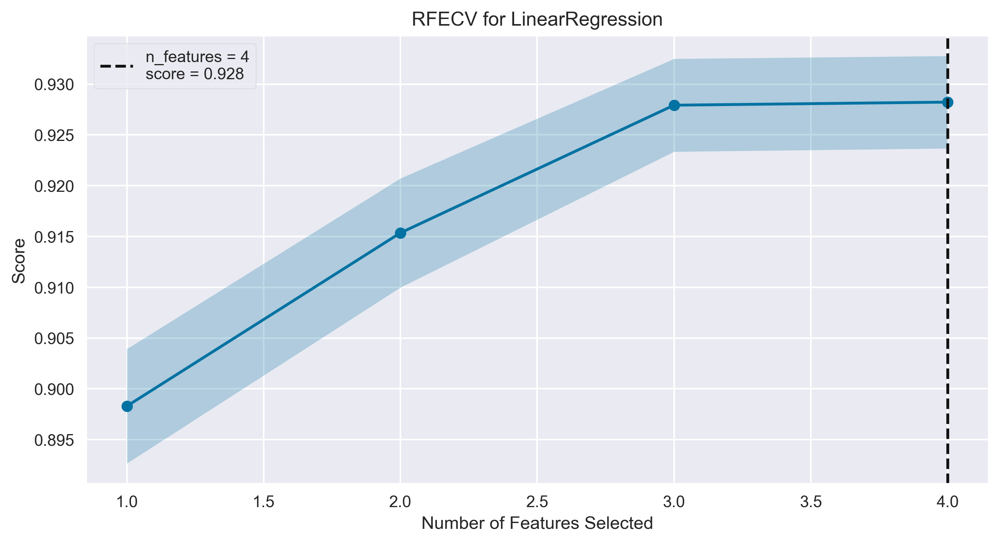

In [64]:
rfe = rfecv(LinearRegression(),x,y)

In [65]:
rfe.ranking_

array([1, 1, 1, 1])

In [66]:
rfe_Sel = pd.DataFrame({
    'Ranking' : rfe.ranking_,
    'Features' : x.columns
})
rfe_Sel

,Ranking,Features
0,1,temperature
1,1,exhaust_vacuum
2,1,amb_pressure
3,1,r_humidity


In [67]:
 #this gives the priority for which feature is more important 1 means first priority

# RFECV with Decision Tree
Recursive Feature Elimination with Cross-Validation (RFECV) is a feature selection method that fits a model and removes the weakest feature (or features) until the specified number of features is reached. Features are ranked by the model’s coef_ or feature_importances_ attributes, and by recursively eliminating a small number of features per loop, RFECV attempts to eliminate dependencies and collinearity that may exist in the model1.

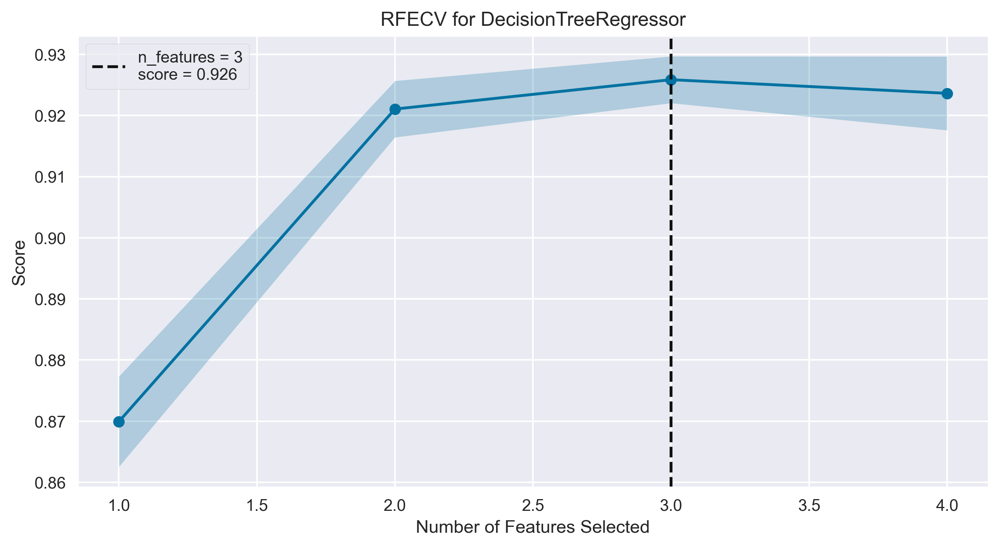

In [68]:
rfe2 = rfecv(DecisionTreeRegressor(),x,y)

In [69]:
rfe2.ranking_

array([1, 1, 1, 2])

In [70]:
rfe_Sel = pd.DataFrame({
    'Ranking' : rfe2.ranking_,
    'Features' : x.columns
})

In [71]:
rfe_Sel #using rfe with decision tree is giving all the feature priority has equal

,Ranking,Features
0,1,temperature
1,1,exhaust_vacuum
2,1,amb_pressure
3,2,r_humidity


# pps
The PPS is an asymmetric, data-type-agnostic score that can detect linear or non-linear relationships between two columns. The score ranges from 0 (no predictive power) to 1 (perfect predictive power). It can be used as an alternative to the correlation (matrix)

In [72]:
feature_sel = ps.matrix(df_cappped)
feature_sel

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
0,temperature,temperature,1.000000,predict_itself,True,None,0.000000,1.000000,None
1,temperature,exhaust_vacuum,0.494432,regression,True,mean absolute error,11.643186,5.886428,DecisionTreeRegressor()
2,temperature,amb_pressure,0.000000,regression,True,mean absolute error,4.728819,5.029004,DecisionTreeRegressor()
3,temperature,r_humidity,0.000000,regression,True,mean absolute error,11.968265,12.003462,DecisionTreeRegressor()
4,temperature,energy_production,0.654677,regression,True,mean absolute error,14.633354,5.053229,DecisionTreeRegressor()
5,exhaust_vacuum,temperature,0.651725,regression,True,mean absolute error,6.380216,2.222068,DecisionTreeRegressor()
6,exhaust_vacuum,exhaust_vacuum,1.000000,predict_itself,True,None,0.000000,1.000000,None
7,exhaust_vacuum,amb_pressure,0.709373,regression,True,mean absolute error,4.728819,1.374320,DecisionTreeRegressor()
8,exhaust_vacuum,r_humidity,0.243912,regression,True,mean absolute error,11.968265,9.049062,DecisionTreeRegressor()
9,exhaust_vacuum,energy_production,0.727989,regression,True,mean absolute error,14.633354,3.980427,DecisionTreeRegressor()


In [73]:
feature_sel[feature_sel['y'] == 'energy_production']

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
4,temperature,energy_production,0.654677,regression,True,mean absolute error,14.633354,5.053229,DecisionTreeRegressor()
9,exhaust_vacuum,energy_production,0.727989,regression,True,mean absolute error,14.633354,3.980427,DecisionTreeRegressor()
14,amb_pressure,energy_production,0.053091,regression,True,mean absolute error,14.633354,13.856451,DecisionTreeRegressor()
19,r_humidity,energy_production,0.000000,regression,True,mean absolute error,14.633354,16.588619,DecisionTreeRegressor()
24,energy_production,energy_production,1.000000,predict_itself,True,None,0.000000,1.000000,None


- temperature
- exhaust_vaccum

#Lasso regularization

In [74]:
from sklearn.linear_model import LinearRegression, Lasso
l1 = Lasso()
l1.fit(x,y)

Lasso()

In [75]:
l1_Sel = pd.DataFrame({
    'coef' :l1.coef_ ,
    'Features' : x.columns
})
l1_Sel.T

,0,1,2,3
coef,-1.917446,-0.254265,0.048983,-0.141625
Features,temperature,exhaust_vacuum,amb_pressure,r_humidity


- temperatuure
- exhaust_vacuum
- relative_humidity

In [76]:
# Tree Based method

In [77]:
rf = RandomForestRegressor()

rf.fit(x,y)

RandomForestRegressor()

In [78]:
rf.feature_importances_

array([0.90112804, 0.06207378, 0.01946367, 0.01733451])

In [79]:
ig_sel = pd.DataFrame({
    'IG': rf.feature_importances_,
    'Features' : x.columns
})
ig_sel

,IG,Features
0,0.901128,temperature
1,0.062074,exhaust_vacuum
2,0.019464,amb_pressure
3,0.017335,r_humidity


- temperature

In [80]:
'''Features are  :
temperature
exhaust_vacuum
relative_humidity
'''

'Features are  :\ntemperature\nexhaust_vacuum\nrelative_humidity\n'

In [112]:
df

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,9.59,38.56,1017.01,60.10,481.30
1,12.04,42.34,1019.72,94.67,465.36
2,13.87,45.08,1024.42,81.69,465.48
3,13.72,54.30,1017.89,79.08,467.05
4,15.14,49.64,1023.78,75.00,463.58
...,...,...,...,...,...
9522,17.10,49.69,1005.53,81.82,457.32
9523,24.73,65.34,1015.42,52.80,446.92
9524,30.44,56.24,1005.19,56.24,429.34
9525,23.00,66.05,1020.61,80.29,421.57


# Model Building

In [113]:
features=['temperature','exhaust_vacuum','r_humidity']
x=df.loc[:,features]
x

,temperature,exhaust_vacuum,r_humidity
0,9.59,38.56,60.10
1,12.04,42.34,94.67
2,13.87,45.08,81.69
3,13.72,54.30,79.08
4,15.14,49.64,75.00
...,...,...,...
9522,17.10,49.69,81.82
9523,24.73,65.34,52.80
9524,30.44,56.24,56.24
9525,23.00,66.05,80.29


In [114]:
y

0       481.30
1       465.36
2       465.48
3       467.05
4       463.58
         ...  
9522    457.32
9523    446.92
9524    429.34
9525    421.57
9526    454.41
Name: energy_production, Length: 9527, dtype: float64

In [84]:
#spliting the data

In [85]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2,random_state=42)

In [86]:
lr=LinearRegression()

In [87]:
lr.fit(xtrain,ytrain)

LinearRegression()

In [88]:
ypred=lr.predict(xtest)

In [89]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(ytest, ypred)
mse
print("Root mean square error:", np.sqrt(mse).round(2))

Root mean square error: 4.58


In [90]:
from xgboost import XGBRegressor
 
from sklearn.linear_model import Lasso, Ridge


In [91]:
def prediction(model):
    model.fit(xtrain,ytrain)
    yp = model.predict(xtest)
    print(f"Train Accuracy: {model.score(xtrain,ytrain)}")
    print(f"Test Accuracy: {model.score(xtest,ytest)}")

In [92]:
prediction(LinearRegression())

Train Accuracy: 0.9281574760789536
Test Accuracy: 0.9278663634332678


In [93]:
prediction(DecisionTreeRegressor())

Train Accuracy: 1.0
Test Accuracy: 0.9270957715158619


In [94]:
prediction(RandomForestRegressor())

Train Accuracy: 0.9938283620086781
Test Accuracy: 0.9551956914657339


In [95]:
prediction(KNeighborsRegressor())

Train Accuracy: 0.9593546527609637
Test Accuracy: 0.9351873290897701


In [96]:
prediction(GradientBoostingRegressor())

Train Accuracy: 0.9503312204352431
Test Accuracy: 0.9427373148144078


In [97]:
prediction(SVR())

Train Accuracy: 0.9352179218268944
Test Accuracy: 0.9342497319103418


In [98]:
prediction(XGBRegressor())

Train Accuracy: 0.9831271397544679
Test Accuracy: 0.9574154723792007


In [99]:
prediction(Lasso())

Train Accuracy: 0.9279482378434041
Test Accuracy: 0.927591408144051


In [100]:
prediction(Ridge())

Train Accuracy: 0.9281574760591974
Test Accuracy: 0.9278663533319464


In [101]:
models = {"Linear Regression": LinearRegression(),"Decision Tree": DecisionTreeRegressor(),"Random Forest": RandomForestRegressor(),"K-Nearest Neighbors": KNeighborsRegressor(),"Gradient Boosting": GradientBoostingRegressor(),"Support Vector Regression": SVR(),"Xtreme Gradient Boosting":XGBRegressor(),"Lasso":Lasso(),"Ridge":Ridge()}
results = []
for name, model in models.items():
    model.fit(xtrain, ytrain) 
    yp = model.predict(xtest)
    Train_Accuracy = model.score(xtrain, ytrain)
    Test_Accuracy = model.score(xtest, ytest)
    results.append({"Regressor MODEL": name, "Train Acc": Train_Accuracy, "Test Acc":Test_Accuracy})
models_df = pd.DataFrame(results)
models_df.sort_values(by=["Train Acc","Test Acc"], ascending=False)

,Regressor MODEL,Train Acc,Test Acc
1,Decision Tree,1.000000,0.926396
2,Random Forest,0.993873,0.955322
6,Xtreme Gradient Boosting,0.983127,0.957415
3,K-Nearest Neighbors,0.959355,0.935187
4,Gradient Boosting,0.950331,0.942738
5,Support Vector Regression,0.935218,0.934250
0,Linear Regression,0.928157,0.927866
8,Ridge,0.928157,0.927866
7,Lasso,0.927948,0.927591


In [102]:
'''Among all regession  models, the Random Forest Regressor model achieves the highest test accuracy of 0.96, making it the top-performing model 
Therefore, we select the Random Forest Regressor as  final model.'''

'Among all regession  models, the Random Forest Regressor model achieves the highest test accuracy of 0.96, making it the top-performing model \nTherefore, we select the Random Forest Regressor as  final model.'

In [103]:
raw_data

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,9.59,38.56,1017.01,60.10,481.30
1,12.04,42.34,1019.72,94.67,465.36
2,13.87,45.08,1024.42,81.69,465.48
3,13.72,54.30,1017.89,79.08,467.05
4,15.14,49.64,1023.78,75.00,463.58
...,...,...,...,...,...
9563,17.10,49.69,1005.53,81.82,457.32
9564,24.73,65.34,1015.42,52.80,446.92
9565,30.44,56.24,1005.19,56.24,429.34
9566,23.00,66.05,1020.61,80.29,421.57


In [104]:
#features=['temperature','exhaust_vacuum','r_humidity']
features=['temperature','exhaust_vacuum','amb_pressure','r_humidity']
x1=raw_data.loc[:,features]

In [105]:
y1=raw_data['energy_production']

In [106]:
xtrain,xtest,ytrain,ytest=train_test_split(x1,y1,test_size=0.2,random_state=42)

In [107]:
models = {"Linear Regression": LinearRegression(),"Decision Tree": DecisionTreeRegressor(),"Random Forest": RandomForestRegressor(),"K-Nearest Neighbors": KNeighborsRegressor(),"Gradient Boosting": GradientBoostingRegressor(),"Support Vector Regression": SVR(),"Xtreme Gradient Boosting":XGBRegressor(),"Lasso":Lasso(),"Ridge":Ridge()}
results = []
for name, model in models.items():
    model.fit(xtrain, ytrain) 
    yp = model.predict(xtest)
    Train_Accuracy = model.score(xtrain, ytrain)
    Test_Accuracy = model.score(xtest, ytest)
    results.append({"Regressor MODEL": name, "Train Acc": Train_Accuracy, "Test Acc":Test_Accuracy})
models_df = pd.DataFrame(results)
models_df.sort_values(by=["Train Acc","Test Acc"], ascending=False)            # raw data

,Regressor MODEL,Train Acc,Test Acc
1,Decision Tree,1.000000,0.941300
2,Random Forest,0.994593,0.963172
6,Xtreme Gradient Boosting,0.988463,0.966764
3,K-Nearest Neighbors,0.964797,0.947644
4,Gradient Boosting,0.953565,0.948736
0,Linear Regression,0.928113,0.930821
8,Ridge,0.928113,0.930821
7,Lasso,0.927884,0.930129
5,Support Vector Regression,0.385512,0.377818


# Table for df_capped data

In [102]:
models = {"Linear Regression": LinearRegression(),"Decision Tree": DecisionTreeRegressor(),"Random Forest": RandomForestRegressor(),"K-Nearest Neighbors": KNeighborsRegressor(),"Gradient Boosting": GradientBoostingRegressor(),"Support Vector Regression": SVR(),"Xtreme Gradient Boosting":XGBRegressor(),"Lasso":Lasso(),"Ridge":Ridge()}
results = []
for name, model in models.items():
    model.fit(xtrain, ytrain) 
    yp = model.predict(xtest)
    Train_Accuracy = model.score(xtrain, ytrain)
    Test_Accuracy = model.score(xtest, ytest)
    results.append({"Regressor MODEL": name, "Train Acc": Train_Accuracy, "Test Acc":Test_Accuracy})
models_df = pd.DataFrame(results)
models_df.sort_values(by=["Train Acc","Test Acc"], ascending=False)           # df

,Regressor MODEL,Train Acc,Test Acc
1,Decision Tree,1.000000,0.925329
2,Random Forest,0.993815,0.954763
6,Xtreme Gradient Boosting,0.983127,0.957415
3,K-Nearest Neighbors,0.959355,0.935187
4,Gradient Boosting,0.950331,0.942737
5,Support Vector Regression,0.935218,0.934250
0,Linear Regression,0.928157,0.927866
8,Ridge,0.928157,0.927866
7,Lasso,0.927948,0.927591


# Table for raw data

In [111]:
models = {"Linear Regression": LinearRegression(),"Decision Tree": DecisionTreeRegressor(),"Random Forest": RandomForestRegressor(),"K-Nearest Neighbors": KNeighborsRegressor(),"Gradient Boosting": GradientBoostingRegressor(),"Support Vector Regression": SVR(),"Xtreme Gradient Boosting":XGBRegressor(),"Lasso":Lasso(),"Ridge":Ridge()}
results = []
for name, model in models.items():
    model.fit(xtrain, ytrain) 
    yp = model.predict(xtest)
    Train_Accuracy = model.score(xtrain, ytrain)
    Test_Accuracy = model.score(xtest, ytest)
    results.append({"Regressor MODEL": name, "Train Acc": Train_Accuracy, "Test Acc":Test_Accuracy})
models_df = pd.DataFrame(results)
models_df.sort_values(by=["Train Acc","Test Acc"], ascending=False) 

,Regressor MODEL,Train Acc,Test Acc
1,Decision Tree,1.000000,0.939551
2,Random Forest,0.994588,0.963595
6,Xtreme Gradient Boosting,0.988463,0.966764
3,K-Nearest Neighbors,0.964797,0.947644
4,Gradient Boosting,0.953565,0.948729
0,Linear Regression,0.928113,0.930821
8,Ridge,0.928113,0.930821
7,Lasso,0.927884,0.930129
5,Support Vector Regression,0.385512,0.377818


In [105]:
#conclusion after comparing cleaned data raw data has same model accuracies,we need bigger data set

# Model Evaluation

In [115]:
#with def function
def evaluation(model):
    model.fit(xtrain, ytrain)
    y_pred = model.predict(xtest)
    
    mse = mean_squared_error(ytest, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(ytest, y_pred)
    r2 = r2_score(ytest, y_pred)
    
    print("MSE:", mse)
    print("RMSE:", rmse)
    print("MAE:", mae)
    print("R-squared:", r2)


In [116]:
evaluation(LinearRegression())

MSE: 20.988340542560504
RMSE: 4.58130336722646
MAE: 3.6338315886478445
R-squared: 0.9308209429828997


In [117]:
evaluation(DecisionTreeRegressor())

MSE: 18.333319905956117
RMSE: 4.281742624908241
MAE: 2.9779049111807736
R-squared: 0.9395720790543189


In [118]:
evaluation(RandomForestRegressor())

MSE: 11.092513165851654
RMSE: 3.33054247320938
MAE: 2.335286833855799
R-squared: 0.9634382909307526


In [119]:
evaluation(KNeighborsRegressor())

MSE: 15.884402754440966
RMSE: 3.9855241505278785
MAE: 2.9117910135841174
R-squared: 0.9476438834407249


In [120]:
evaluation(GradientBoostingRegressor())

MSE: 15.553025163189863
RMSE: 3.943732389905515
MAE: 2.9390751067854026
R-squared: 0.9487361274527212


In [121]:
evaluation(SVR())

MSE: 188.7648871063777
RMSE: 13.739173450625685
MAE: 11.543423858321837
R-squared: 0.377817562018388


In [122]:
evaluation(XGBRegressor())

MSE: 10.083559099867255
RMSE: 3.1754620293537217
MAE: 2.216406017849562
R-squared: 0.9667638749957163


In [123]:
evaluation(Lasso())

MSE: 21.19823146539024
RMSE: 4.604153718696873
MAE: 3.657836456630374
R-squared: 0.9301291276348322


In [124]:
evaluation(Ridge())

MSE: 20.9883774554018
RMSE: 4.581307395864394
MAE: 3.6338378270424805
R-squared: 0.9308208213155603


In [125]:
#with for loop andconvert it in data frame
models={"Linear Regression": LinearRegression(),"Decision Tree": DecisionTreeRegressor(),"Random Forest": RandomForestRegressor(),"K-Nearest Neighbors": KNeighborsRegressor(),"Gradient Boosting": GradientBoostingRegressor(),"Support Vector Regression": SVR(),"Xtreme Gradient Boosting":XGBRegressor(),"Lasso":Lasso(),"Ridge":Ridge()}
results=[]
for name, model in models.items():
    model.fit(xtrain, ytrain)
    y_pred = model.predict(xtest)
    
    mse = mean_squared_error(ytest, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(ytest, y_pred)
    r2 = r2_score(ytest, y_pred)
    results.append({"Regressor MODEL": name, "MSE": mse, "RMSE":rmse,"MAE":mae,"R-squared":r2})
models_df = pd.DataFrame(results)
models_df.sort_values(by=["MSE","RMSE","MAE","R-squared"], ascending=False)

,Regressor MODEL,MSE,RMSE,MAE,R-squared
5,Support Vector Regression,188.764887,13.739173,11.543424,0.377818
7,Lasso,21.198231,4.604154,3.657836,0.930129
8,Ridge,20.988377,4.581307,3.633838,0.930821
0,Linear Regression,20.988341,4.581303,3.633832,0.930821
1,Decision Tree,18.110053,4.255591,2.940805,0.940308
3,K-Nearest Neighbors,15.884403,3.985524,2.911791,0.947644
4,Gradient Boosting,15.553025,3.943732,2.939075,0.948736
2,Random Forest,11.072990,3.327610,2.347714,0.963503
6,Xtreme Gradient Boosting,10.083559,3.175462,2.216406,0.966764


In [126]:
models={"Linear Regression": LinearRegression(),"Decision Tree": DecisionTreeRegressor(),"Random Forest": RandomForestRegressor(),"K-Nearest Neighbors": KNeighborsRegressor(),"Gradient Boosting": GradientBoostingRegressor(),"Support Vector Regression": SVR(),"Xtreme Gradient Boosting":XGBRegressor(),"Lasso":Lasso(),"Ridge":Ridge()}
results=[]
for name, model in models.items():
    model.fit(xtrain, ytrain)
    y_pred = model.predict(xtest)
    
    Train_Accuracy = model.score(xtrain, ytrain)
    Test_Accuracy = model.score(xtest, ytest)
    mse = mean_squared_error(ytest, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(ytest, y_pred)
    r2 = r2_score(ytest, y_pred)
    results.append({"Regressor MODEL": name,"Train Acc": Train_Accuracy,"Test Acc":Test_Accuracy,"MSE": mse, "RMSE":rmse,"MAE":mae,"R-squared":r2})
models_df = pd.DataFrame(results)
models_df.sort_values(by=["Train Acc","Test Acc","MSE","RMSE","MAE","R-squared"], ascending=False)

,Regressor MODEL,Train Acc,Test Acc,MSE,RMSE,MAE,R-squared
1,Decision Tree,1.000000,0.941658,17.700558,4.207203,2.973501,0.941658
2,Random Forest,0.994569,0.963380,11.110237,3.333202,2.338522,0.963380
6,Xtreme Gradient Boosting,0.988463,0.966764,10.083559,3.175462,2.216406,0.966764
3,K-Nearest Neighbors,0.964797,0.947644,15.884403,3.985524,2.911791,0.947644
4,Gradient Boosting,0.953565,0.948736,15.553025,3.943732,2.939075,0.948736
0,Linear Regression,0.928113,0.930821,20.988341,4.581303,3.633832,0.930821
8,Ridge,0.928113,0.930821,20.988377,4.581307,3.633838,0.930821
7,Lasso,0.927884,0.930129,21.198231,4.604154,3.657836,0.930129
5,Support Vector Regression,0.385512,0.377818,188.764887,13.739173,11.543424,0.377818


In [127]:
# Here among all the modeles xtreme gradient boosting gives least error and r2 accuracy 96%.
# so our final model is xtreme gradient boosting.

# Deployment

In [128]:
#pipeline

In [129]:
import pickle

In [130]:
from sklearn.compose import ColumnTransformer 
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor

In [131]:
from sklearn import set_config
set_config(display='diagram')

In [132]:
x=df.loc[:,['temperature','exhaust_vacuum','r_humidity']]
x

,temperature,exhaust_vacuum,r_humidity
0,9.59,38.56,60.10
1,12.04,42.34,94.67
2,13.87,45.08,81.69
3,13.72,54.30,79.08
4,15.14,49.64,75.00
...,...,...,...
9522,17.10,49.69,81.82
9523,24.73,65.34,52.80
9524,30.44,56.24,56.24
9525,23.00,66.05,80.29


In [133]:
transformer= ColumnTransformer(transformers=[
    ('tnf1',StandardScaler(),[0,1,2])], remainder='passthrough')

In [134]:
from sklearn.model_selection import train_test_split

In [135]:
xtrain,xtest,ytrain,ytest = train_test_split(x, df['energy_production'], test_size=0.2,random_state=1)

In [136]:
model1= Pipeline(steps=[('transformer', transformer),('model1',XGBRegressor())])

In [137]:
model1.fit(xtrain,ytrain)

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('tnf1', StandardScaler(),
                                                  [0, 1, 2])])),
                ('model1',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, device=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_typ..._policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [138]:
ypred = model1.predict(xtest)
ypred

array([438.27637, 475.5893 , 440.9045 , ..., 458.78903, 432.6918 ,
       450.44583], dtype=float32)

In [139]:
import pickle

pickle.dump(model1, open('model1.pkl','wb'))            # save the model

In [140]:
model1=pickle.load(open('model1.pkl','rb'))

In [141]:
model1.predict([[15.14,49.64,75.00]])

array([462.96667], dtype=float32)